In [2]:
import matplotlib.pyplot as plt
import cv2
from PIL import Image
import pillow_avif

In [3]:
img = Image.open('Art.avif')
img.save('Art.jpg')

In [4]:
image = cv2.imread("Art.jpg")
image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)

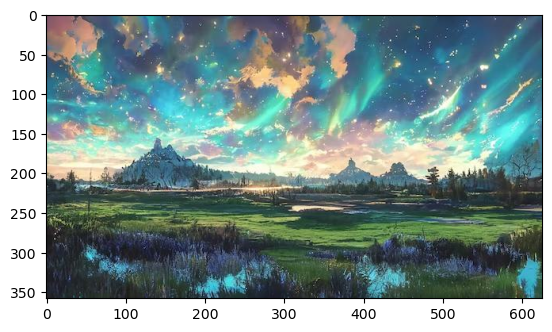

In [5]:
plt.imshow(image)

In [6]:
grayscale = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)

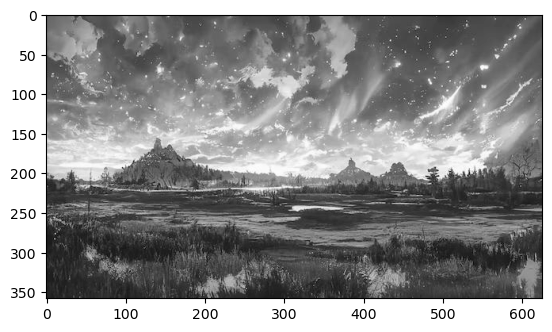

In [7]:
plt.imshow(grayscale, cmap="gray")

# GLOBAL THRESHOLDING

In [8]:
ret, thresh1 = cv2.threshold(grayscale, 120, 255, cv2.THRESH_BINARY) 
ret, thresh2 = cv2.threshold(grayscale, 120, 255, cv2.THRESH_BINARY_INV) 
ret, thresh3 = cv2.threshold(grayscale, 120, 255, cv2.THRESH_TRUNC) 
ret, thresh4 = cv2.threshold(grayscale, 120, 255, cv2.THRESH_TOZERO) 
ret, thresh5 = cv2.threshold(grayscale, 120, 255, cv2.THRESH_TOZERO_INV)

Binary

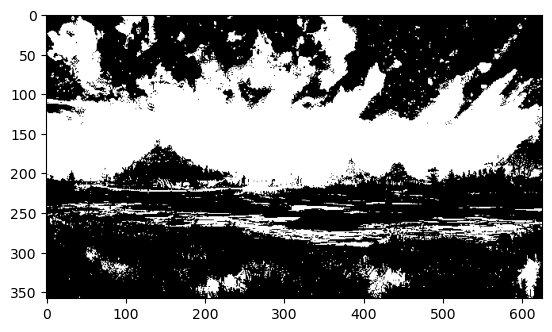

In [9]:
plt.imshow(thresh1,cmap="gray")

Inverse Binary

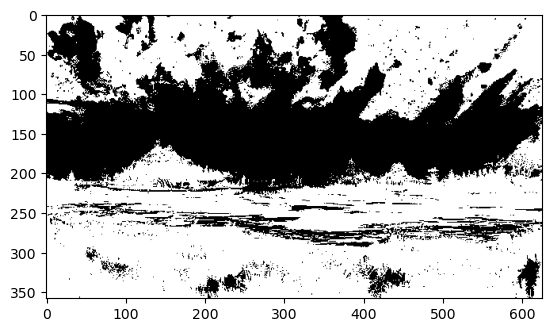

In [10]:
plt.imshow(thresh2,cmap="gray")

truncated threshold

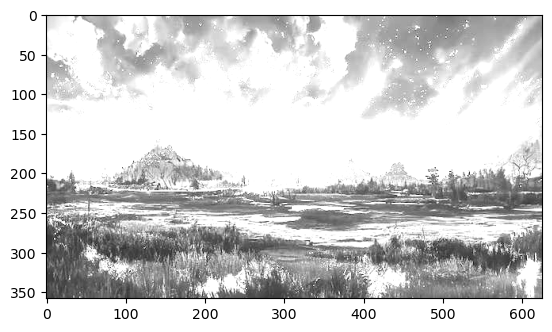

In [11]:
plt.imshow(thresh3,cmap="gray")

Thresh to zero

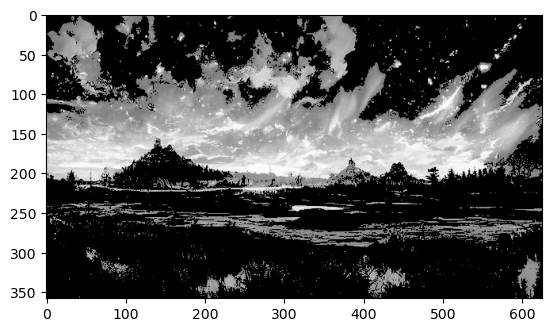

In [12]:
plt.imshow(thresh4,cmap="gray")

Inverse thresh to zero

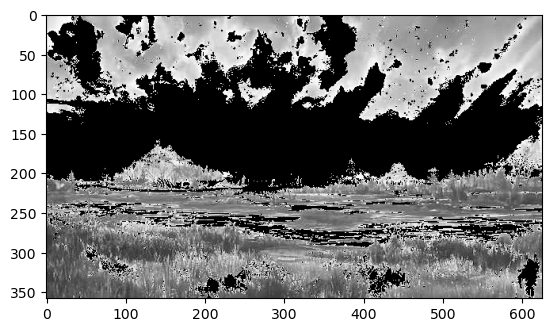

In [13]:
plt.imshow(thresh5,cmap="gray")

OTSU thesholding

In [24]:
ret, threshotsu = cv2.threshold(grayscale, 120, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

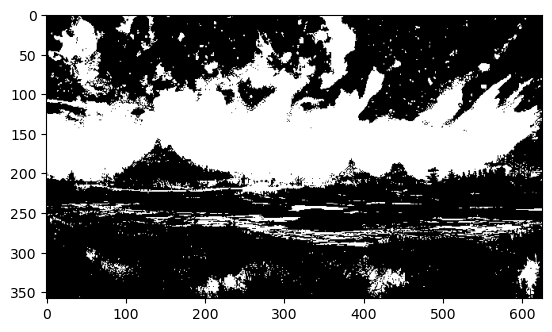

In [25]:
plt.imshow(threshotsu,cmap="gray")

# Adaptive Thresholding

In [26]:
thresh1 = cv2.adaptiveThreshold(grayscale, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 199, 5) 
thresh2 = cv2.adaptiveThreshold(grayscale, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 199, 5) 

Adaptive mean

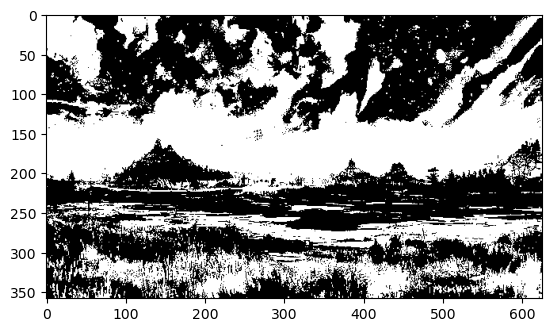

In [28]:
plt.imshow(thresh1,cmap="gray")

Adaptive Gaussian

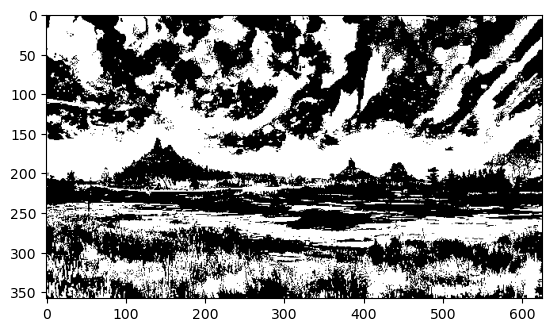

In [30]:
plt.imshow(thresh2,cmap="gray")

# Question 2: K-Means segmentation

In [ ]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
from skimage.metrics import structural_similarity as ssim

In [ ]:
image = cv2.imread("Art.jpg")
original_image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)

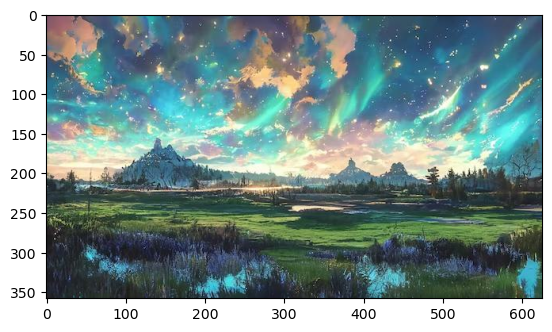

In [ ]:
plt.imshow(original_image)

In [ ]:
pixel_vals = image.reshape((-1,3))
pixel_vals = np.float32(pixel_vals)

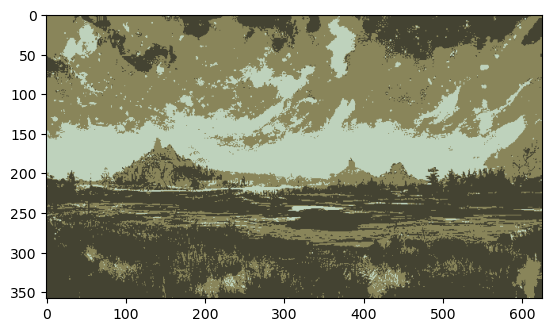

In [ ]:
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.85)
k = 3
retval, labels, centers = cv2.kmeans(pixel_vals, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
centers = np.uint8(centers)
segmented_data = centers[labels.flatten()]
segmented_image = segmented_data.reshape((image.shape))

plt.imshow(segmented_image)

In [ ]:
img=cv2.cvtColor(original_image,cv2.COLOR_BGR2RGB)

In [ ]:
vectorized = img.reshape((-1,3))

In [ ]:
vectorized = np.float32(vectorized)

In [ ]:
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)

2 cluster

In [ ]:
K = 2
attempts=10
ret,label,center=cv2.kmeans(vectorized,K,None,criteria,attempts,cv2.KMEANS_PP_CENTERS) 
center = np.uint8(center)
res = center[label.flatten()]
result_image = res.reshape((img.shape))

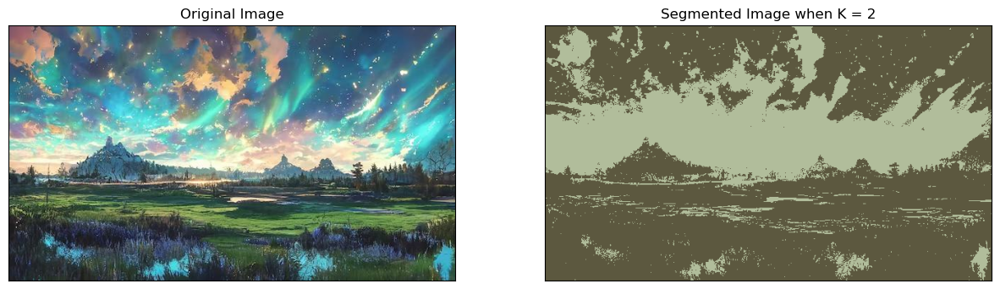

In [ ]:
figure_size = 15
plt.figure(figsize=(figure_size,figure_size))
plt.subplot(1,2,1),plt.imshow(original_image)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(result_image)
plt.title('Segmented Image when K = %i' % K), plt.xticks([]), plt.yticks([])
plt.show()

3 clusters

In [ ]:
K = 3
attempts=10
ret,label,center=cv2.kmeans(vectorized,K,None,criteria,attempts,cv2.KMEANS_PP_CENTERS)
center = np.uint8(center)
res = center[label.flatten()]
result_image = res.reshape((img.shape))

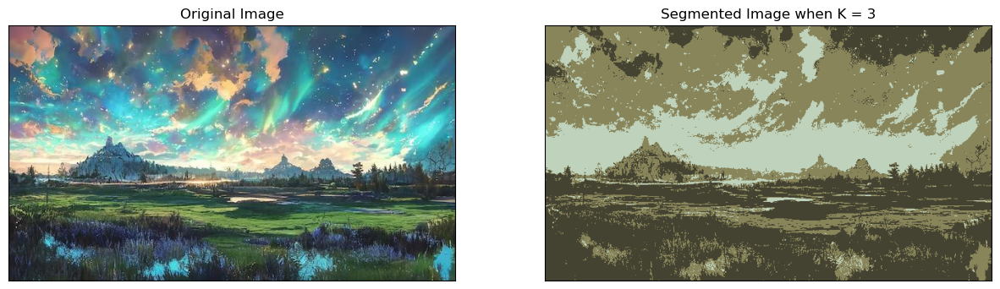

In [ ]:
figure_size = 15
plt.figure(figsize=(figure_size,figure_size))
plt.subplot(1,2,1),plt.imshow(original_image)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(result_image)
plt.title('Segmented Image when K = %i' % K), plt.xticks([]), plt.yticks([])
plt.show()

In [ ]:
grayA = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
grayB = cv2.cvtColor(result_image, cv2.COLOR_BGR2GRAY)
(score, diff) = ssim(grayA, grayB, full=True)
diff = (diff * 255).astype("uint8")
print("SSIM: {}".format(score))

SSIM: 0.6166945120990682


4 clusters

In [ ]:
K = 4
attempts=10
ret,label,center=cv2.kmeans(vectorized,K,None,criteria,attempts,cv2.KMEANS_PP_CENTERS)
center = np.uint8(center)
res = center[label.flatten()]
result_image = res.reshape((img.shape))

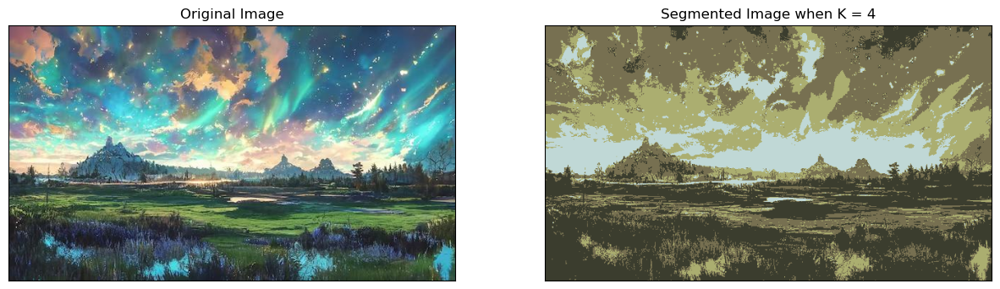

In [ ]:
figure_size = 15
plt.figure(figsize=(figure_size,figure_size))
plt.subplot(1,2,1),plt.imshow(original_image)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(result_image)
plt.title('Segmented Image when K = %i' % K), plt.xticks([]), plt.yticks([])
plt.show()

5 clusters

In [ ]:
K = 5
attempts=10
ret,label,center=cv2.kmeans(vectorized,K,None,criteria,attempts,cv2.KMEANS_PP_CENTERS)
center = np.uint8(center)
res = center[label.flatten()]
result_image = res.reshape((img.shape))

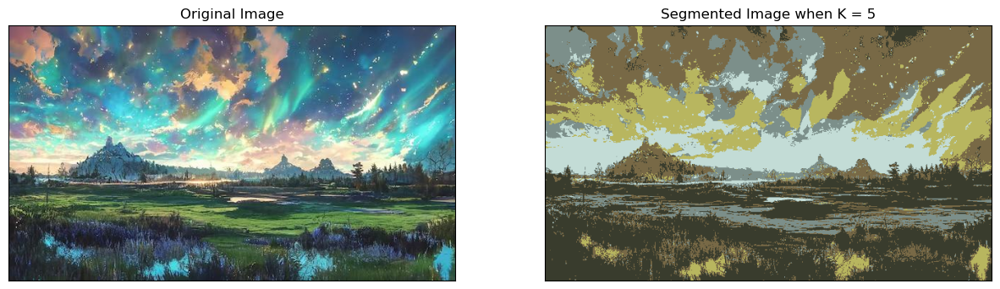

In [ ]:
figure_size = 15
plt.figure(figsize=(figure_size,figure_size))
plt.subplot(1,2,1),plt.imshow(original_image)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(result_image)
plt.title('Segmented Image when K = %i' % K), plt.xticks([]), plt.yticks([])
plt.show()

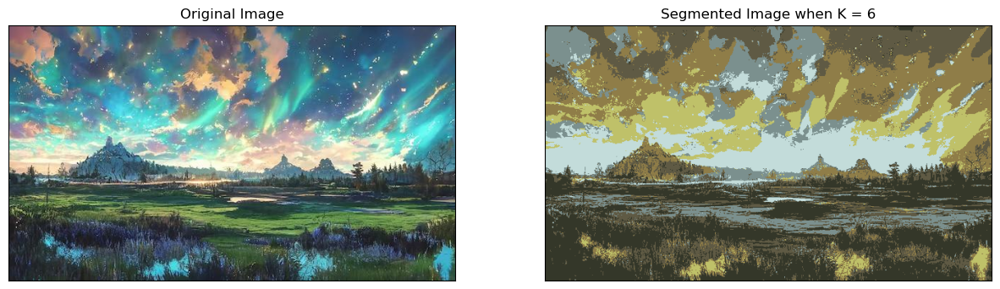

In [ ]:
K = 6
attempts=10
ret,label,center=cv2.kmeans(vectorized,K,None,criteria,attempts,cv2.KMEANS_PP_CENTERS)
center = np.uint8(center)
res = center[label.flatten()]
result_image = res.reshape((img.shape))
figure_size = 15
plt.figure(figsize=(figure_size,figure_size))
plt.subplot(1,2,1),plt.imshow(original_image)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(result_image)
plt.title('Segmented Image when K = %i' % K), plt.xticks([]), plt.yticks([])
plt.show()

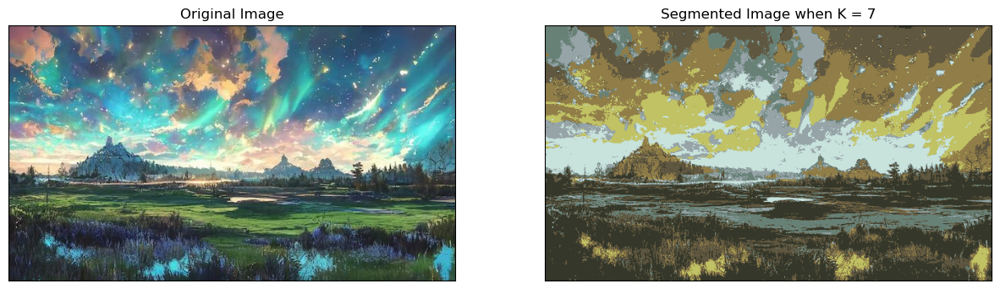

In [ ]:
K = 7
attempts=10
ret,label,center=cv2.kmeans(vectorized,K,None,criteria,attempts,cv2.KMEANS_PP_CENTERS)
center = np.uint8(center)
res = center[label.flatten()]
result_image = res.reshape((img.shape))
figure_size = 15
plt.figure(figsize=(figure_size,figure_size))
plt.subplot(1,2,1),plt.imshow(original_image)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(result_image)
plt.title('Segmented Image when K = %i' % K), plt.xticks([]), plt.yticks([])
plt.show()

In [ ]:
grayA = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
grayB = cv2.cvtColor(result_image, cv2.COLOR_BGR2GRAY)
(score, diff) = ssim(grayA, grayB, full=True)
diff = (diff * 255).astype("uint8")
print("SSIM: {}".format(score))

SSIM: 0.7503341435417512


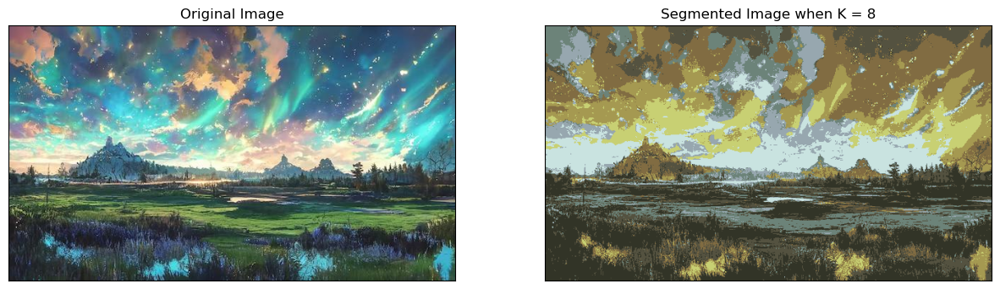

In [ ]:
K = 8
attempts=10
ret,label,center=cv2.kmeans(vectorized,K,None,criteria,attempts,cv2.KMEANS_PP_CENTERS)
center = np.uint8(center)
res = center[label.flatten()]
result_image = res.reshape((img.shape))
figure_size = 15
plt.figure(figsize=(figure_size,figure_size))
plt.subplot(1,2,1),plt.imshow(original_image)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(result_image)
plt.title('Segmented Image when K = %i' % K), plt.xticks([]), plt.yticks([])
plt.show()

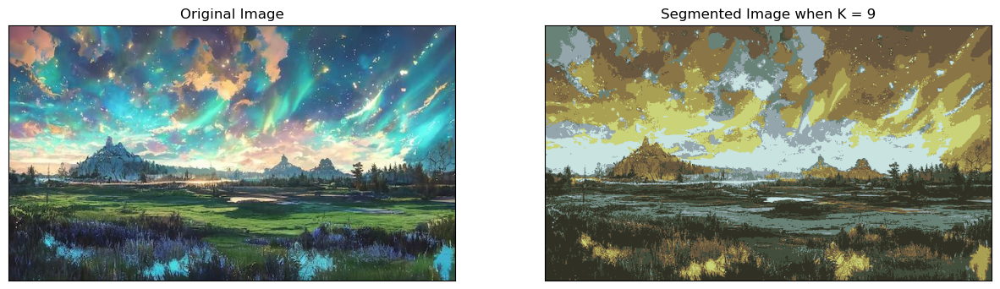

In [ ]:
K = 9
attempts=10
ret,label,center=cv2.kmeans(vectorized,K,None,criteria,attempts,cv2.KMEANS_PP_CENTERS)
center = np.uint8(center)
res = center[label.flatten()]
result_image = res.reshape((img.shape))
figure_size = 15
plt.figure(figsize=(figure_size,figure_size))
plt.subplot(1,2,1),plt.imshow(original_image)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(result_image)
plt.title('Segmented Image when K = %i' % K), plt.xticks([]), plt.yticks([])
plt.show()

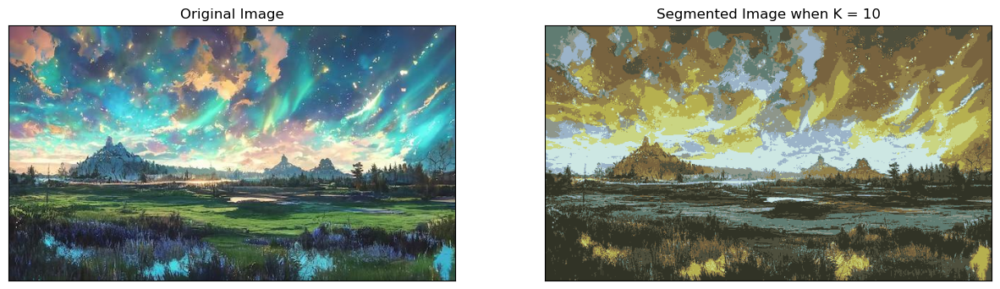

In [ ]:
K = 10
attempts=10
ret,label,center=cv2.kmeans(vectorized,K,None,criteria,attempts,cv2.KMEANS_PP_CENTERS)
center = np.uint8(center)
res = center[label.flatten()]
result_image = res.reshape((img.shape))
figure_size = 15
plt.figure(figsize=(figure_size,figure_size))
plt.subplot(1,2,1),plt.imshow(original_image)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(result_image)
plt.title('Segmented Image when K = %i' % K), plt.xticks([]), plt.yticks([])
plt.show()

In [ ]:
grayA = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
grayB = cv2.cvtColor(result_image, cv2.COLOR_BGR2GRAY)
(score, diff) = ssim(grayA, grayB, full=True)
diff = (diff * 255).astype("uint8")
print("SSIM: {}".format(score))

SSIM: 0.7966854023655722


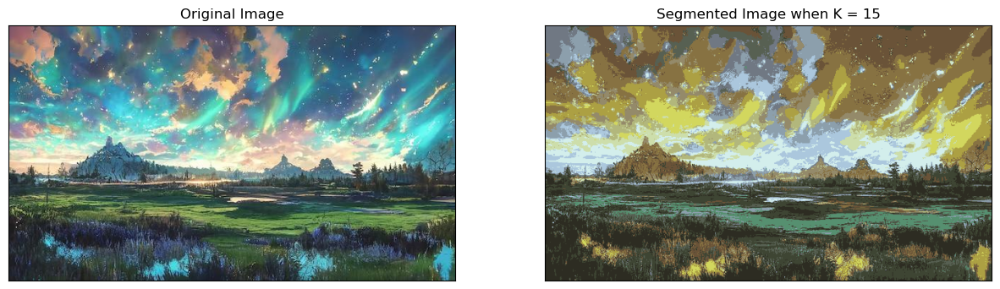

In [ ]:
K = 15
attempts=10
ret,label,center=cv2.kmeans(vectorized,K,None,criteria,attempts,cv2.KMEANS_PP_CENTERS)
center = np.uint8(center)
res = center[label.flatten()]
result_image = res.reshape((img.shape))
figure_size = 15
plt.figure(figsize=(figure_size,figure_size))
plt.subplot(1,2,1),plt.imshow(original_image)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(result_image)
plt.title('Segmented Image when K = %i' % K), plt.xticks([]), plt.yticks([])
plt.show()

In [ ]:
grayA = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
grayB = cv2.cvtColor(result_image, cv2.COLOR_BGR2GRAY)
(score, diff) = ssim(grayA, grayB, full=True)
diff = (diff * 255).astype("uint8")
print("SSIM: {}".format(score))

SSIM: 0.8281410661571798


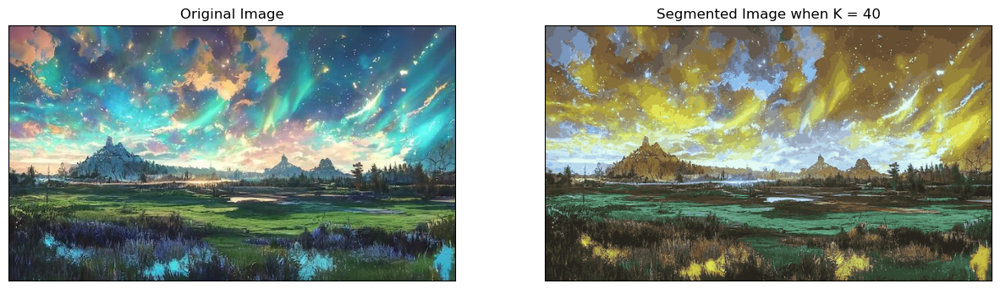

In [ ]:
K = 40
attempts=10
ret,label,center=cv2.kmeans(vectorized,K,None,criteria,attempts,cv2.KMEANS_PP_CENTERS)
center = np.uint8(center)
res = center[label.flatten()]
result_image = res.reshape((img.shape))
figure_size = 15
plt.figure(figsize=(figure_size,figure_size))
plt.subplot(1,2,1),plt.imshow(original_image)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(result_image)
plt.title('Segmented Image when K = %i' % K), plt.xticks([]), plt.yticks([])
plt.show()

In [ ]:
grayA = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
grayB = cv2.cvtColor(result_image, cv2.COLOR_BGR2GRAY)
(score, diff) = ssim(grayA, grayB, full=True)
diff = (diff * 255).astype("uint8")
print("SSIM: {}".format(score))

SSIM: 0.9014890529303865


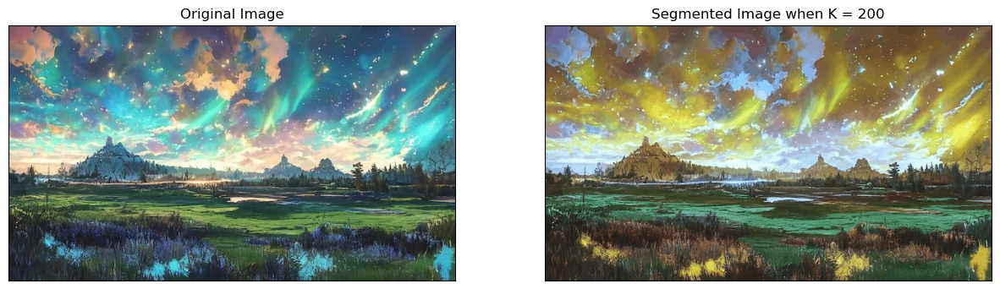

SSIM: 0.9512003089566196


In [ ]:
K = 200
attempts=10
ret,label,center=cv2.kmeans(vectorized,K,None,criteria,attempts,cv2.KMEANS_PP_CENTERS)
center = np.uint8(center)
res = center[label.flatten()]
result_image = res.reshape((img.shape))
figure_size = 15
plt.figure(figsize=(figure_size,figure_size))
plt.subplot(1,2,1),plt.imshow(original_image)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(result_image)
plt.title('Segmented Image when K = %i' % K), plt.xticks([]), plt.yticks([])
plt.show()
grayA = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
grayB = cv2.cvtColor(result_image, cv2.COLOR_BGR2GRAY)
(score, diff) = ssim(grayA, grayB, full=True)
diff = (diff * 255).astype("uint8")
print("SSIM: {}".format(score))

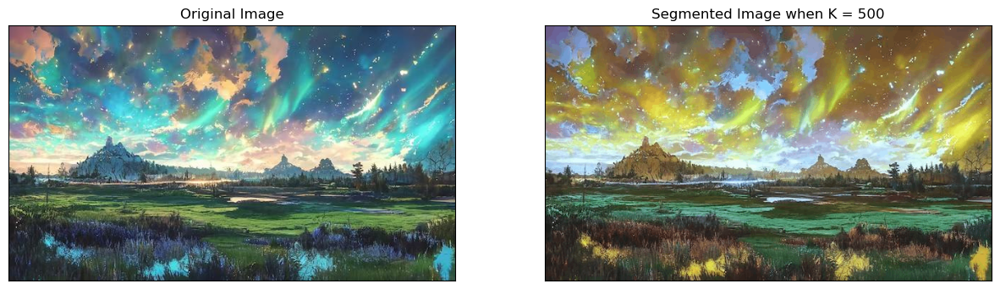

SSIM: 0.9648024966899958


In [ ]:
K = 500
attempts=10
ret,label,center=cv2.kmeans(vectorized,K,None,criteria,attempts,cv2.KMEANS_PP_CENTERS)
center = np.uint8(center)
res = center[label.flatten()]
result_image = res.reshape((img.shape))
figure_size = 15
plt.figure(figsize=(figure_size,figure_size))
plt.subplot(1,2,1),plt.imshow(original_image)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(result_image)
plt.title('Segmented Image when K = %i' % K), plt.xticks([]), plt.yticks([])
plt.show()
grayA = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
grayB = cv2.cvtColor(result_image, cv2.COLOR_BGR2GRAY)
(score, diff) = ssim(grayA, grayB, full=True)
diff = (diff * 255).astype("uint8")
print("SSIM: {}".format(score))

SIFT

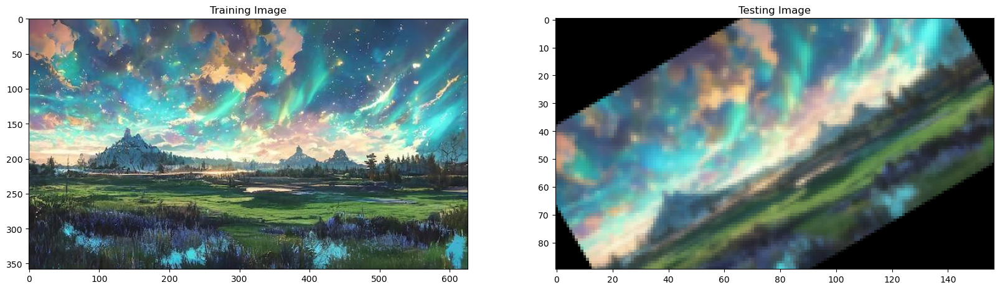

In [ ]:
training_gray = cv2.cvtColor(original_image, cv2.COLOR_RGB2GRAY)
test_image = cv2.pyrDown(original_image)
test_image = cv2.pyrDown(test_image)
num_rows, num_cols = test_image.shape[:2]

rotation_matrix = cv2.getRotationMatrix2D((num_cols/2, num_rows/2), 30, 1)
test_image = cv2.warpAffine(test_image, rotation_matrix, (num_cols, num_rows))

test_gray = cv2.cvtColor(test_image, cv2.COLOR_RGB2GRAY)
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Training Image")
plots[0].imshow(original_image)

plots[1].set_title("Testing Image")
plots[1].imshow(test_image)



In [ ]:
training_image = original_image

Number of Keypoints Detected In The Training Image:  1433
Number of Keypoints Detected In The Query Image:  152


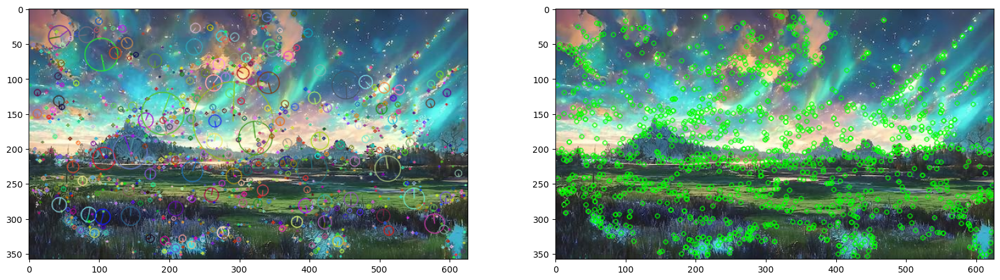

In [ ]:
sift = cv2.xfeatures2d.SIFT_create()

train_keypoints, train_descriptor = sift.detectAndCompute(training_gray, None)
test_keypoints, test_descriptor = sift.detectAndCompute(test_gray, None)

keypoints_without_size = np.copy(training_image)
keypoints_with_size = np.copy(training_image)

cv2.drawKeypoints(training_image, train_keypoints, keypoints_without_size, color = (0, 255, 0))
cv2.drawKeypoints(training_image, train_keypoints, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].imshow(keypoints_with_size, cmap='gray')

plots[1].imshow(keypoints_without_size, cmap='gray')
print("Number of Keypoints Detected In The Training Image: ", len(train_keypoints))
print("Number of Keypoints Detected In The Query Image: ", len(test_keypoints))

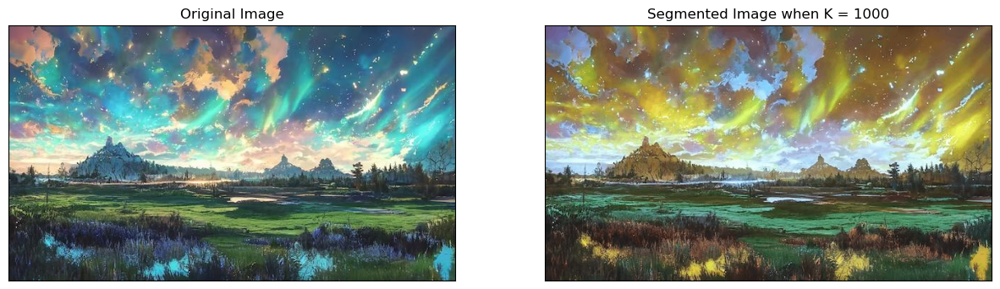

SSIM: 0.9716776979124546


In [ ]:
K = 1000
attempts=100
ret,label,center=cv2.kmeans(vectorized,K,None,criteria,attempts,cv2.KMEANS_PP_CENTERS)
center = np.uint8(center)
res = center[label.flatten()]
result_image = res.reshape((img.shape))
figure_size = 15
plt.figure(figsize=(figure_size,figure_size))
plt.subplot(1,2,1),plt.imshow(original_image)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(result_image)
plt.title('Segmented Image when K = %i' % K), plt.xticks([]), plt.yticks([])
plt.show()
grayA = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
grayB = cv2.cvtColor(result_image, cv2.COLOR_BGR2GRAY)
(score, diff) = ssim(grayA, grayB, full=True)
diff = (diff * 255).astype("uint8")
print("SSIM: {}".format(score))

## At 1000 clusters the segmented image is ver close to the original image with a ssim of 0.97